In [1]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm  # colormaps 
                                        
%matplotlib inline

In [2]:
import seaborn as sns
import numpy as np
from statistics import mean
from math import ceil, sin, cos, radians
from collections import OrderedDict
import os
import pandas as pd
from pprint import pprint
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
import pickle

In [3]:
import torch
import torchvision

In [4]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [5]:
from moe_expectation_model import moe_expectation_model
from moe_pre_softmax_expectation_model import moe_pre_softmax_expectation_model
from moe_stochastic_model import moe_stochastic_model, moe_stochastic_loss
from moe_em_model import moe_em_model
from moe_models import cross_entropy_loss
from experts_gates import escort

device cpu
device cpu
device cpu
device cpu
device cpu


In [6]:
import data_generator
import datagen

device cpu


### Generate dataset for training

In [7]:
fig_path = 'figures/exps'
model_path = 'results/exps'

In [8]:
palette = ['tab:purple', 'tab:green', 'tab:orange','tab:blue', 'tab:olive','tab:brown', 'tab:cyan']

In [9]:
def plot_data(X, y, num_classes, dataset, path):
    f, ax = plt.subplots(nrows=1, ncols=1,figsize=(8,8))
    sns.scatterplot(x=X[:,0],y=X[:,1],hue=y,palette=palette[0:num_classes], ax=ax)
    ax.set_title("2D 3 classes Generated Data")
    plt.ylabel('Dim 2')
    plt.xlabel('Dim 1')
    plt.savefig(os.path.join(path, dataset+'_'+str(num_classes)+'.png'))

In [10]:
dataset = 'multi_class_linear_expert_linear_gate'

In [11]:
batchsize = 32

NUM CLASSES 5
4058803790
2400 600
2400 600


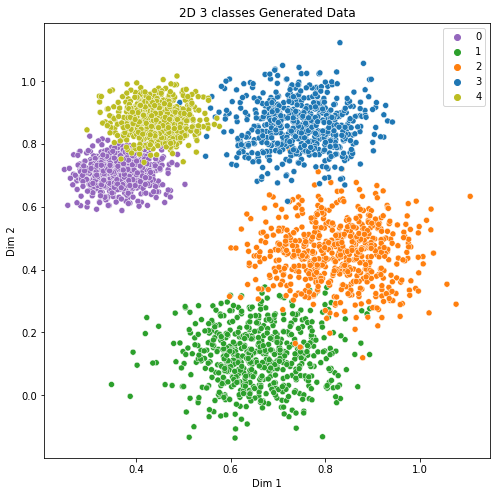

In [12]:
X, y, trainset, trainloader, testset, testloader, num_classes = data_generator.generate_data(dataset, 3000,batchsize,5)
plot_data(X, y, num_classes, dataset, fig_path)
print(len(trainset), len(testset))

### Networks and callbacks

In [13]:
#Expert network
class expert_layers(nn.Module):
    def __init__(self, output):
        super(expert_layers, self).__init__()
        linear_2 = nn.Linear(2,output)
        self.model = nn.Sequential(OrderedDict({
                    #'linear_1':nn.Linear(2, 2),
                    #'relu_1':nn.ReLU(),
                    'linear_2':linear_2,
                    'softmax': nn.Softmax(dim=1)
                    })
                )     
        
    def forward(self, input):
        return self.model(input)


In [14]:
#Expert network
class expert_layers_presoftmax(nn.Module):
    def __init__(self, output):
        super(expert_layers_presoftmax, self).__init__()
        self.model = nn.Sequential(OrderedDict({
#                     'linear_1':nn.Linear(2, 2),
#                     'relu_1':nn.ReLU(),
                    'linear_2':nn.Linear(2,output)
                    })
                )     
    def forward(self, input):
        return self.model(input)


In [15]:
# create a set of experts
def experts(num_experts, num_classes, expert_layers_type=expert_layers):
    models = []
    for i in range(num_experts):
        models.append(expert_layers_type(num_classes))
    return nn.ModuleList(models)

In [16]:
#Gate network (Similar to the expert layer)
class gate_layers(nn.Module):
    def __init__(self, num_classes, num_experts):
        super(gate_layers, self).__init__()
        self.model = nn.Sequential(OrderedDict({
#                     'linear_1':nn.Linear(2, 2),
#                     'relu_1':nn.ReLU(),
                    'linear_2':nn.Linear(2,num_experts),
                    'escort':escort()
                    })
                )
    def forward(self, inputs, T=1.0):
        t = self.model(inputs)
        return t

In [16]:
#Gate network (Similar to the expert layer)
class gate_layers(nn.Module):
    def __init__(self, num_classes, num_experts):
        super(gate_layers, self).__init__()
        self.model = nn.Sequential(OrderedDict({
#                     'linear_1':nn.Linear(2+(num_experts*num_classes), 8),
#                     'relu_1':nn.ReLU(),
                    'linear_2':nn.Linear(2,num_experts)
                    })
                )
        
    def forward(self, input_aug, T=1.0):
        t = self.model(input_aug)
        return F.softmax(t/T, dim=1)

In [18]:
#Gate network (Similar to the expert layer)
class gate_layers(nn.Module):
    def __init__(self, num_classes, num_experts):
        super(gate_layers, self).__init__()
        self.model = nn.Sequential(OrderedDict({
                    'linear_1':nn.Linear(2,8),
                    'relu':nn.ReLU(),
                    'linear_3':nn.Linear(8, num_experts),
                    })
                )
    def forward(self, input, T=1.0):
        t = self.model(input)
        return F.softmax(t/T, dim=1)

In [15]:
#Gate network (Similar to the expert layer)
class gate_layers(nn.Module):
    def __init__(self, num_classes, num_experts):
        super(gate_layers, self).__init__()
        self.model = nn.Sequential(OrderedDict({
                    'linear_1':nn.Linear(2,8),
                    'relu':nn.ReLU(),
                    'linear_2':nn.Linear(8,16),
                    'relu':nn.ReLU(),
                    'linear_3':nn.Linear(16, num_experts),
                    })
                )
    def forward(self, input, T=1.0):
        t = self.model(input)
        return F.softmax(t/T, dim=1)

### Mixture of experts model

In [17]:
# compute
def accuracy(out, yb, mean=True):
    preds = torch.argmax(out, dim=1)
    if mean:
        return (preds == yb).float().mean()
    else:
        return (preds == yb).float()

In [18]:
total_experts = 5

In [19]:
num_epochs = 20

In [20]:
def plot_boundary_components(gate_model):
    layer_1_neurons = {}
    layer_2_neurons = {}

    parameters = gate_model.parameters()

    for i, parameter in enumerate(parameters, 0):
        if i == 0:
            layer_1_neurons['wts']= parameter.detach().numpy()
        if i == 1:
            layer_1_neurons['bias'] = parameter.detach().numpy()
        if i == 2:
            layer_2_neurons['wts']= parameter.detach().numpy()
        if i == 3:
            layer_2_neurons['bias'] = parameter.detach().numpy()
    
    print(layer_1_neurons['bias'],layer_2_neurons['bias'] )
    labels = [] 
    fig,ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(20,10))
    outputs = []
    x2 = np.linspace(-1, 1, 100)

    for i in range(0,4):
        x1 = ((-1* layer_1_neurons['wts'][i][1]*x2)-layer_1_neurons['bias'][i])/layer_1_neurons['wts'][i][0]
        labels.append('neuron '+str(i+1))    
        sns.lineplot(x=x1, y=x2,ax=ax)
        #print(layer_1_neurons['wts'].shape)
        #print(np.asarray([x1, x2]).shape)

        #print(np.dot(layer_1_neurons['wts'], np.asarray([x1, x2]))[:,0])
        #print(np.repeat(np.reshape(layer_1_neurons['bias'],(4,1)),100,axis=1)[:,0])
        #z = np.transpose(np.dot(layer_1_neurons['wts'], np.asarray([x1, x2]))+np.repeat(np.reshape(layer_1_neurons['bias'],(4,1)),100,axis=1))
        #z = np.where(z<0,0,z)
        #print(z[0,:])
    plt.legend(labels)
    plt.show()


In [20]:
# experiment with models with different number of experts
w_importance=0.0
w_ortho = 0.0
w_ideal_gate = 0.0

augment = False
attention = False
T_max = 1
#T_decay = T_max/num_epochs
#T_decay = T_max/(num_epochs - T_decay_start)
T_decay = 0
T_decay_start = 0

task = 'classification'

def generate_plot_file(dataset, specific):
    plot_file = dataset
    if T_decay > 0:
        plot_file += '_Tdecay_'+str(T_decay)
    if T_decay_start > 0:
        plot_file += '_Tdecaystart_'+str(T_decay_start)
    if w_importance > 0:
        plot_file += '_importance_'+str(w_importance)
    if w_ortho > 0:
        plot_file += '_ortho_'+str(w_ortho)
    if augment:
        plot_file += '_augment'
    if attention:
        plot_file += '_attention'
    plot_file += '_'+specific
    
    return plot_file


In [21]:
models = {#'moe_em_model':{'model':moe_em_model,'loss':cross_entropy_loss,'experts':{}},
#         'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}}, 
#           'moe_pre_softmax_expectation_model':{'model':moe_pre_softmax_expectation_model,'loss':cross_entropy_loss,'experts':{}},
          'moe_stochastic_model':{'model':moe_stochastic_model, 'loss':moe_stochastic_loss(cross_entropy_loss),'experts':{}}
         }
# if not attention:
#     models['moe_stochastic_model'] = {'model':moe_stochastic_model, 'loss':moe_stochastic_loss,'experts':{}}

for T in range(1, T_max+1):
    print('Temperature', T)
    for key, val in models.items():
        print('Model:', key)
        for num_experts in range(total_experts, total_experts+1):
            print('Number of experts ', num_experts)
            if 'pre_softmax' in key:
                expert_models = experts(num_experts, num_classes, expert_layers_presoftmax)
            else:
                expert_models = experts(num_experts, num_classes)
            gate_model = gate_layers(num_classes, num_experts)
            #plot_boundary_components(gate_model)
            moe_model = val['model'](num_experts, num_classes, augment, attention, expert_models, gate_model, task)
            params = [p.numel() for p in moe_model.parameters() if p.requires_grad]
            print('model params:', sum(params))
                        
            optimizer_moe = optim.RMSprop(moe_model.parameters(),
                                      lr=0.01, momentum=0.9)
            optimizer_gate = optim.RMSprop(gate_model.parameters(),
                                      lr=0.01, momentum=0.9)
            params = []
            for i, expert in enumerate(expert_models):
                params.append({'params':expert.parameters()})
            optimizer_experts = optim.RMSprop(params, lr=0.01, momentum=0.9)

            #optimizer = optim.SGD(moe_model.parameters(),lr=0.001, momentum=0.9)
            hist = moe_model.train(trainloader, testloader, val['loss'], optimizer_moe, optimizer_gate, optimizer_experts,  
                                   w_importance, w_ortho, w_ideal_gate, T=T, T_decay=T_decay, T_decay_start=T_decay_start,
                                   accuracy=accuracy, epochs=num_epochs)
            val['experts'][num_experts] = {'model':moe_model, 'history':hist}
    plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
    print('model file:', plot_file)
    torch.save(models,open(os.path.join(model_path, plot_file),'wb'))
    models = {'moe_expectation_model':{'model':moe_expectation_model,'loss':cross_entropy_loss,'experts':{}}, 
              'moe_stochastic_model':{'model':moe_stochastic_model, 'loss':moe_stochastic_loss(cross_entropy_loss),'experts':{}}
      #'moe_pre_softmax_expectation_model':{'model':moe_pre_softmax_expectation_model,'loss':cross_entropy_loss,'experts':{}}
     }
    
        

Temperature 1
Model: moe_stochastic_model
Number of experts  5
model params: 90
epoch 0 training loss 0.38 , training accuracy 0.72 , test accuracy 0.89
epoch 1 training loss 0.20 , training accuracy 0.89 , test accuracy 0.91
epoch 2 training loss 0.16 , training accuracy 0.94 , test accuracy 0.93
epoch 3 training loss 0.14 , training accuracy 0.94 , test accuracy 0.93
epoch 4 training loss 0.12 , training accuracy 0.94 , test accuracy 0.94
epoch 5 training loss 0.11 , training accuracy 0.96 , test accuracy 0.95
epoch 6 training loss 0.10 , training accuracy 0.96 , test accuracy 0.96
epoch 7 training loss 0.09 , training accuracy 0.96 , test accuracy 0.95
epoch 8 training loss 0.09 , training accuracy 0.96 , test accuracy 0.94
epoch 9 training loss 0.08 , training accuracy 0.97 , test accuracy 0.95
epoch 10 training loss 0.08 , training accuracy 0.97 , test accuracy 0.94
epoch 11 training loss 0.07 , training accuracy 0.96 , test accuracy 0.95
epoch 12 training loss 0.07 , training acc

In [ ]:
plt.rcParams["figure.figsize"] = (4,8)
fontsize = 25
labelsize = 15
for T in range(1, T_max+1):

        plot_file = generate_plot_file(dataset,'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))

        for m_key, m_val in models.items():
                        
            for i in range(total_experts, total_experts+1):
                
                fig,ax = plt.subplots(8, 3, sharex=False, sharey=False, figsize=(45,80))

                history = m_val['experts'][i]['history']
                legend_labels = ['E'+str(j) for j in range(1, i+1)]

                ax[0,0].plot(range(num_epochs), history['mean_gate_probability'], marker='o')            
                ax[0,0].set_title(m_key+'\n'+'Average gate probabilities for ' + str(i) + ' Experts with low T', fontsize=fontsize)
                ax[0,0].legend(legend_labels)
                ax[0,0].set_xlabel('epochs', fontsize=fontsize)
                ax[0,0].set_xlim(0, num_epochs)
                ax[0,0].set_ylim(0, 1)
                ax[0,0].set_ylabel('average gate probabilities', fontsize=fontsize)
                ax[0,0].tick_params(labelsize=labelsize)

                if T>1:
                    ax[0,1].plot(range(num_epochs), history['mean_gate_probability_T'], marker='o')
                    ax[0,1].set_title(m_key+'\n'+'Average gate probabilities for ' + str(i) + ' Experts with high T = '+str(T), fontsize=fontsize)
                    ax[0,1].legend(legend_labels)
                    ax[0,1].set_xlabel('epochs', fontsize=fontsize)
                    ax[0,1].set_xlim(0, num_epochs)
                    ax[0,1].set_ylim(0, 1)
                    ax[0,1].set_ylabel('average gate probabilities', fontsize=fontsize)
                else:
                    ax[0,1].axis('off')
                ax[0,2].axis('off')
                  
                ax[1,0].plot(range(num_epochs), history['var_gate_probability'], marker='o')            
                ax[1,0].set_title(m_key+'\n'+'Variance gate probabilities for ' + str(i) + ' Experts with low T', fontsize=fontsize)
                ax[1,0].legend(legend_labels)
                ax[1,0].set_xlabel('epochs', fontsize=fontsize)
                ax[1,0].set_xlim(0, num_epochs)
                ax[1,0].set_ylabel('variance gate probabilities', fontsize=fontsize)
                
                if T> 1:
                    ax[1,1].plot(range(num_epochs), history['var_gate_probability_T'], marker='o')
                    ax[1,1].set_title(m_key+'\n'+'Variance gate probabilities for ' + str(i) + ' Experts with high T = '+str(T), fontsize=fontsize)
                    ax[1,1].legend(legend_labels)
                    ax[1,1].set_xlabel('epochs', fontsize=fontsize)
                    ax[1,1].set_xlim(0, num_epochs)
                    ax[1,1].set_ylabel('variance gate probabilities', fontsize=fontsize)
                else:
                    ax[1,1].axis('off')                   
                ax[1,2].axis('off')
                
                ax[2,0].plot(range(num_epochs), history['mean_gate_log_probability'], marker='o')            
                ax[2,0].set_title(m_key+'\n'+'Average gate log probabilities for ' + str(i) + ' Experts with low T', fontsize=fontsize)
                ax[2,0].legend(legend_labels)
                ax[2,0].set_xlabel('epochs', fontsize=fontsize)
                ax[2,0].set_xlim(0, num_epochs)
                ax[2,0].set_ylabel('average gate log probabilities', fontsize=fontsize)

                if T>1:
                    ax[2,1].plot(range(num_epochs), history['mean_gate_log_probability_T'], marker='o')
                    ax[2,1].set_title(m_key+'\n'+'Average gate log probabilities for ' + str(i) + ' Experts with high T = '+str(T), fontsize=fontsize)
                    ax[2,1].legend(legend_labels)
                    ax[2,1].set_xlabel('epochs', fontsize=fontsize)
                    ax[2,1].set_xlim(0, num_epochs)
                    ax[2,1].set_ylabel('average gate log probabilities', fontsize=fontsize)
                else:
                    ax[2,1].axis('off')
                ax[2,2].axis('off')
                                   

                ax[3,0].plot(range(num_epochs), 1-np.asarray(history['expert_sample_accuracy']), marker='o')

                ax[3,0].set_title(m_key+'\n'+'Gated training error for ' + str(i) + ' experts and low T', fontsize=fontsize)
                ax[3,0].legend(legend_labels)
                ax[3,0].set_xlabel('epochs', fontsize=fontsize)
                ax[3,0].set_xlim(0, num_epochs)
                ax[3,0].set_ylabel('error', fontsize=fontsize)

                if T > 1:
                    ax[3,1].plot(range(num_epochs), 1-np.asarray(history['expert_sample_accuracy_T']), marker='o')
                    ax[3,1].set_title(m_key+'\n'+'Gated training error for ' + str(i) + ' experts and high T = '+str(T), fontsize=fontsize)
                    ax[3,1].legend(legend_labels)
                    ax[3,1].set_xlabel('epochs', fontsize=fontsize)
                    ax[3,1].set_xlim(0, num_epochs)
                    ax[3,1].set_ylabel('error', fontsize=fontsize)
                    
                    ax[3,2].plot(range(num_epochs), 1-np.asarray(history['expert_accuracy']), marker='o')

                    ax[3,2].set_title(m_key+'\n'+'Overall Training error for ' + str(i) + ' Experts', fontsize=fontsize)
                    ax[3,2].legend(legend_labels)
                    ax[3,2].set_xlabel('epochs', fontsize=fontsize)
                    ax[3,2].set_xlim(0, num_epochs)
                    ax[3,2].set_ylabel('error', fontsize=fontsize)
                else:
                    ax[3,1].plot(range(num_epochs), 1-np.asarray(history['expert_accuracy']), marker='o')

                    ax[3,1].set_title(m_key+'\n'+'Overall training error for ' + str(i) + ' experts', fontsize=fontsize)
                    ax[3,1].legend(legend_labels)
                    ax[3,1].set_xlabel('epochs', fontsize=fontsize)
                    ax[3,1].set_xlim(0, num_epochs)
                    ax[3,1].set_ylabel('error', fontsize=fontsize)
                    
                    ax[3,2].axis('off')
                    
                ax[4,0].plot(range(len(history['expert_sample_val_accuracy'])), 1-np.asarray(history['expert_sample_val_accuracy']), marker='o')
                
                ax[4,0].set_title(m_key+'\n'+'Gated validation error for ' + str(i) + ' experts', fontsize=fontsize)
                ax[4,0].legend(legend_labels)
                ax[4,0].set_xlabel('epochs', fontsize=fontsize)
                ax[4,0].set_xlim(0, num_epochs)
                ax[4,0].set_ylabel('error', fontsize=fontsize)
                
                ax[4,1].plot(range(len(history['expert_val_accuracy'])), 1-np.asarray(history['expert_val_accuracy']), marker='o')

                ax[4,1].set_title(m_key+'\n'+'Overall validation error for ' + str(i) + ' experts', fontsize=fontsize)
                ax[4,1].legend(legend_labels)
                ax[4,1].set_xlabel('epochs', fontsize=fontsize)
                ax[4,1].set_xlim(0, num_epochs)
                ax[4,1].set_ylabel('error', fontsize=fontsize)
                
                ax[4,2].axis('off')
                
                ax[5,0].plot(range(num_epochs), history['expert_sample_loss'], marker='o')

                ax[5,0].set_title(m_key+'\n'+'Gated training loss for ' + str(i) + ' experts', fontsize=fontsize)
                ax[5,0].legend(legend_labels)
                ax[5,0].set_xlabel('epochs', fontsize=fontsize)
                ax[5,0].set_xlim(0, num_epochs)
                ax[5,0].set_ylabel('loss', fontsize=fontsize)


                if T > 1:
                    ax[5,1].plot(range(num_epochs), history['expert_sample_loss_T'], marker='o')

                    ax[5,1].set_title(m_key+'\n'+'Gated training loss for ' + str(i) + ' experts and high T = '+str(T), fontsize=fontsize)
                    ax[5,1].legend(legend_labels)
                    ax[5,1].set_xlabel('epochs', fontsize=fontsize)
                    ax[5,1].set_xlim(0, num_epochs)
                    ax[5,1].set_ylabel('loss', fontsize=fontsize)
                    
                    ax[5,2].plot(range(num_epochs), history['expert_loss'], marker='o')

                    ax[5,2].set_title(m_key+'\n'+'Overall training loss for ' + str(i) + ' Experts', fontsize=fontsize)
                    ax[5,2].legend(legend_labels)
                    ax[5,2].set_xlabel('epochs', fontsize=fontsize)
                    ax[5,2].set_xlim(0, num_epochs)
                    ax[5,2].set_ylabel('loss', fontsize=fontsize)

                else:               
                    ax[5,1].plot(range(num_epochs), history['expert_loss'], marker='o')

                    ax[5,1].set_title(m_key+'\n'+'Overall Training loss for ' + str(i) + ' Experts', fontsize=fontsize)
                    ax[5,1].legend(legend_labels)
                    ax[5,1].set_xlabel('Number of epochs', fontsize=fontsize)
                    ax[5,1].set_xlim(0, num_epochs)
                    ax[5,1].set_ylabel('loss', fontsize=fontsize)
                    
                    ax[5,2].axis('off')
                    
                ax[6,0].plot(range(num_epochs), history['cv'], marker='o')

                ax[6,0].set_title(m_key+'\n'+'Coefficient of Variance for ' + str(i) + ' experts', fontsize=fontsize)
                ax[6,0].set_xlabel('epochs', fontsize=fontsize)
                ax[6,0].set_xlim(0, num_epochs)

                if T > 1:
                    ax[6,1].plot(range(num_epochs), history['cv_T'], marker='o')

                    ax[6,1].set_title(m_key+'\n'+'Coefficient of variance for ' + str(i) + ' experts and high T = '+str(T), fontsize=fontsize)
                    ax[6,1].set_xlabel('epochs', fontsize=fontsize)
                    ax[6,1].set_xlim(0, num_epochs)
                    
                else:               
                    ax[6,1].axis('off')
                ax[6,2].axis('off')
                
                ax[7,0].plot(range(num_epochs), history['entropy'], marker='o')

                ax[7,0].set_title(m_key+'\n'+'Expert selection entropy for' + str(i) + ' experts', fontsize=fontsize)
                ax[7,0].set_xlabel('epochs', fontsize=fontsize)
                ax[7,0].set_ylabel('entropy', fontsize=fontsize)
                ax[7,0].set_xlim(0, num_epochs)

                if T > 1:
                    ax[7,1].plot(range(num_epochs), history['cv_T'], marker='o')

                    ax[7,1].set_title(m_key+'\n'+'Expert selection entropy for ' + str(i) + ' experts and high T = '+str(T), fontsize=fontsize)
                    ax[7,1].set_xlabel('epochs', fontsize=fontsize)
                    ax[7,0].set_ylabel('entropy', fontsize=fontsize)
                    ax[7,1].set_xlim(0, num_epochs)
                    
                else:               
                    ax[7,1].axis('off')
                ax[7,2].axis('off')
                
                image_file = generate_plot_file(dataset+'_'+m_key,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
                plt.savefig(os.path.join(fig_path, 'dashboard_'+image_file))
                plt.show()


model:  multi_class_linear_expert_linear_gate_T_1_5_3_model.pt
moe_em_model


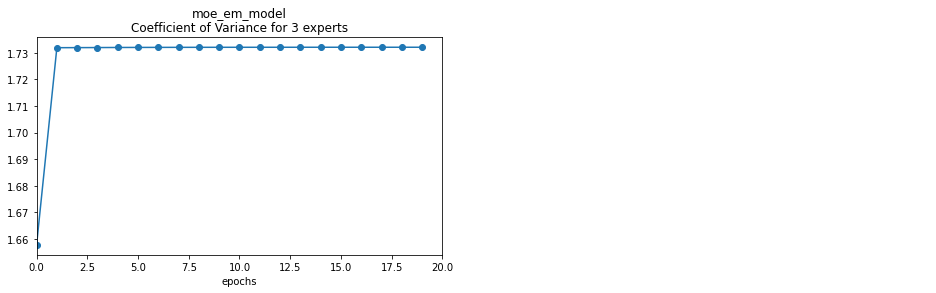

moe_expectation_model


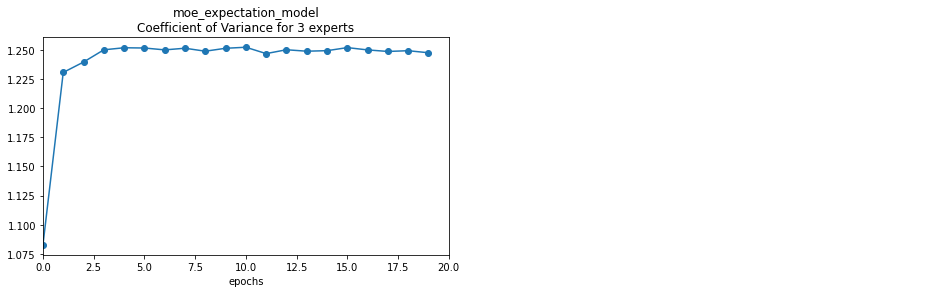

moe_pre_softmax_expectation_model


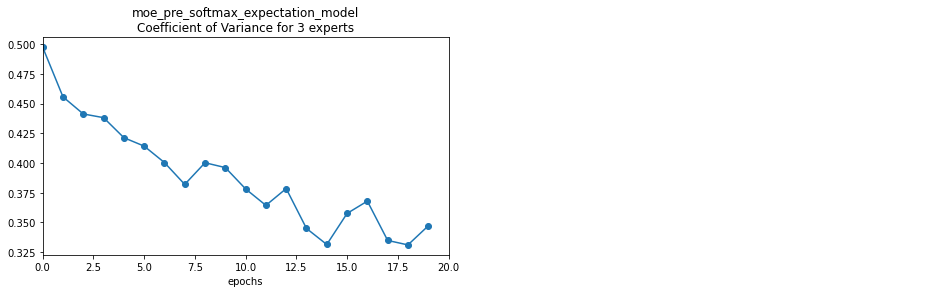

moe_stochastic_model


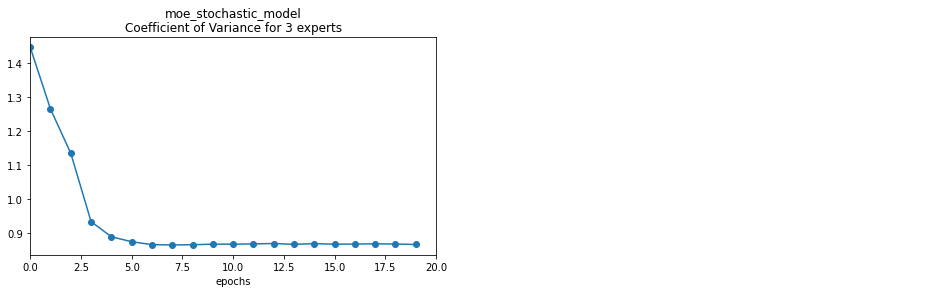

In [22]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
        plot_file = generate_plot_file(dataset,'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))
        
        legend_labels = []
        for m_key, m_val in models.items():
            fig,ax = plt.subplots(1, 2, sharex=True, sharey=False, figsize=(16,4))

            print(m_key)
            history = m_val['experts'][total_experts]['history']
            
            legend_labels.append(m_key)
            ax[0].plot(range(num_epochs), history['cv'], marker='o')
            ax[0].set_title(m_key+'\n'+'Coefficient of Variance for ' + str(total_experts) + ' experts')
            ax[0].set_xlabel('epochs')
            ax[0].set_xlim(0, num_epochs)
#             ax[0].set_ylim(0, 1)

            if T > 1:
                ax[1].plot(range(num_epochs), history['cv_T'], marker='o')
                ax[1].legend(legend_labels)
                ax[1].set_title(m_key+'\n'+'Coefficient of variance for ' + str(total_experts) + ' experts and high T = '+str(T))
                ax[1].set_xlabel('Number of epochs')
                ax[1].set_xlim(0, num_epochs)
            else:               
                ax[1].axis('off')
            plt.show()

In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    plot_file = generate_plot_file(dataset,'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
    print('model: ', plot_file)
    models = torch.load(os.path.join(model_path, plot_file))
    
    for m_key, m_val in models.items():
        
        fig,ax = plt.subplots(2, 3, sharex=True, sharey=False, figsize=(30,20))
               
        for i in range(total_experts, total_experts+1):

            legend_labels = ['E'+str(j) for j in range(1, i+1)]
            
            history = m_val['experts'][i]['history']
            
            ax[0,0].plot(range(num_epochs), history['per_exp_avg_wts'], marker='o')
            ax[0,0].plot(range(num_epochs), history['gate_avg_wts'], marker='o')
            
            ax[0,0].set_title(m_key+'\n'+'Average weights/biases for ' + str(i) + ' Experts and High T = ' + str(T))
            ax[0,0].legend(legend_labels + ['Gate'])
            ax[0,0].set_xlabel('Number of epochs')
            ax[0,0].set_xlim(0, num_epochs)
            ax[0,0].set_ylabel('Average weights/biases')
            
                        
            legend_labels = ['Actual', 'Trivial gate loss', 'Trivial expert']

            ax[0,1].plot(range(num_epochs), history['loss'], marker='o')
            ax[0,1].plot(range(num_epochs), history['baseline_losses'], marker='o')

            ax[0,1].set_title(m_key+'\n'+'Comparing actual loss with trivial gate and expert losses for ' + str(i) + ' Experts and T = '+str(T))
            ax[0,1].legend(legend_labels)
            ax[0,1].set_xlabel('Number of epochs')
            ax[0,1].set_xlim(0, num_epochs)

            ax[0,1].set_ylabel('loss')
            
            ax[0,2].plot(range(num_epochs), history['kl_div_gate'], marker='o')

            ax[0,2].set_title(m_key+'\n'+'Gate probabilities KL divergence for ' + str(i) + ' Experts')
            ax[0,2].set_xlabel('Number of epochs')
            ax[0,2].set_xlim(0, num_epochs)
            ax[0,2].set_ylabel('KL divergence')

            if T>1:
                ax[1,0].plot(range(num_epochs), history['kl_div_gate_T'], marker='o')
                ax[1,0].set_title(m_key+'\n'+'Gate probabilities KL divergence for ' + str(i) + ' Experts and High T = '+str(T))
                ax[1,0].set_xlabel('Number of epochs')
                ax[1,0].set_xlim(0, num_epochs)
                ax[1,0].set_ylabel('KL divergence')
            else:
                ax[1,0].axis('off')
            ax[1,1].axis('off')
            ax[1,2].axis('off')
            
            image_file = generate_plot_file(dataset+'_'+m_key,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'dashboard_misc_'+image_file))
            plt.show()
            

In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    plot_file = generate_plot_file(dataset,'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
    print('model: ', plot_file)
    models = torch.load(os.path.join(model_path, plot_file))

    for m_key, m_val in models.items():
        for i in range(total_experts, total_experts+1):

            legend_labels = ['E'+str(j) for j in range(1, i+1)]
            history = m_val['experts'][i]['history']
            plt.plot(range(num_epochs), history['per_exp_avg_wts'], marker='o')
            legend_labels += ['Gate']
            plt.plot(range(num_epochs), history['gate_avg_wts'], marker='o')
            if T > 1:
                plt.title(m_key+'\n'+'Average weights/biases for ' + str(i) + ' Experts and High T = ' + str(T))
            else:
                plt.title(m_key+'\n'+'Average weights/biases for ' + str(i) + ' Experts and Low T')
            plt.legend(legend_labels)
            plt.xlabel('Number of epochs')
            plt.xlim(0, num_epochs)
            #plt.ylim(0, 1)
            plt.ylabel('Average weights/biases')
            image_file = generate_plot_file(dataset+'_'+m_key,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'avg_wts_biases_'+image_file))
            plt.show()
            plt.close()


                        

In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(1, total_experts+1):

        plot_file = generate_plot_file(dataset,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))

        for m_key, m_val in models.items():
            history = m_val['experts'][i]['history']
            legend_labels = ['Actual', 'Trivial gate loss', 'Trivial expert']

            plt.plot(range(num_epochs), history['loss'], marker='o')
            plt.plot(range(num_epochs), history['baseline_losses'], marker='o')

            plt.title(m_key+'\n'+'Comparing actual loss with trivial gate and expert losses for ' + str(i) + ' Experts and T = '+str(T))
            plt.legend(legend_labels)
            plt.xlabel('Number of epochs')
            plt.xlim(0, num_epochs)
            #plt.ylim(0, 1)
            plt.ylabel('loss')
            image_file = generate_plot_file(dataset+'_'+m_key,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'losses_'+image_file))
            plt.show()

                        

model:  multi_class_linear_expert_linear_gate_T_1_5_3_model.pt


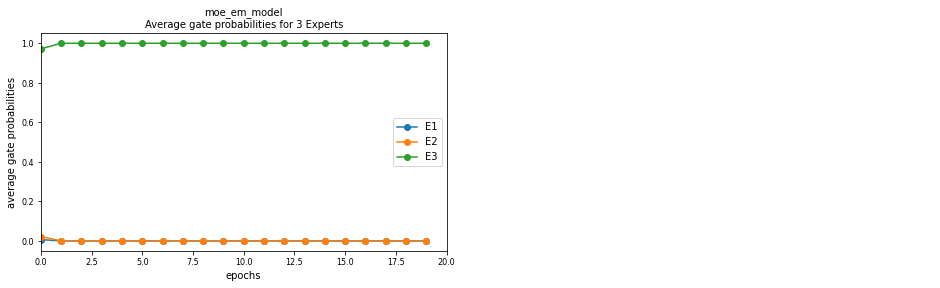

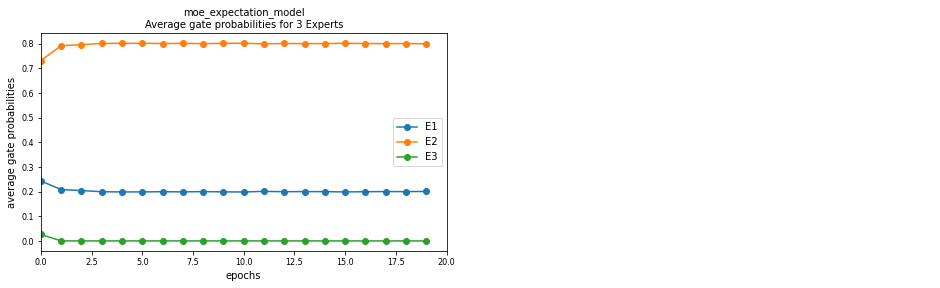

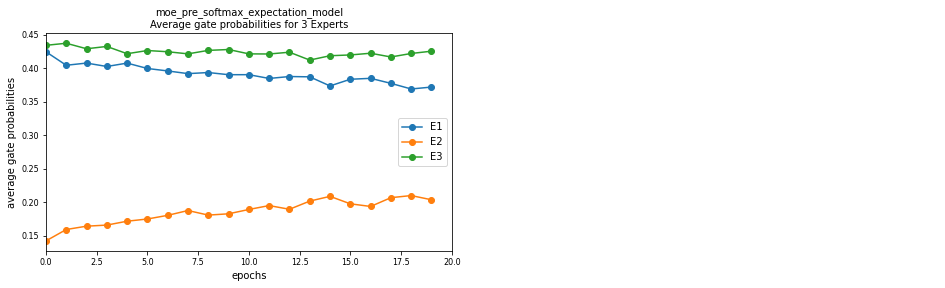

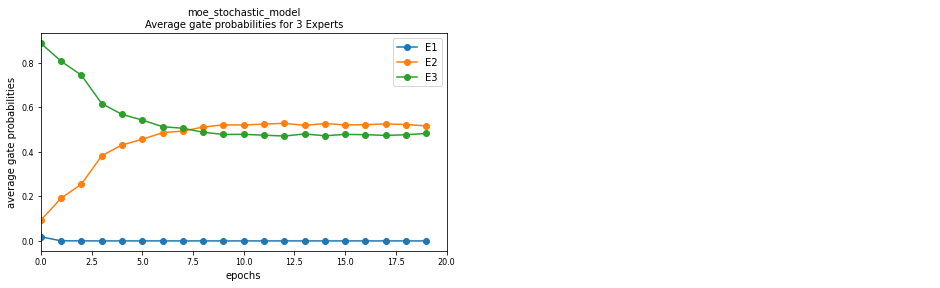

In [32]:
plt.rcParams["figure.figsize"] = (8,4)
fontsize=10
labelsize=8
for T in range(1, T_max+1):
    for i in range(total_experts, total_experts+1):
 
        plot_file = generate_plot_file(dataset,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))

        for m_key, m_val in models.items():

            fig,ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(16,4))

            history = m_val['experts'][i]['history']
            legend_labels = ['E'+str(i) for i in range(1, total_experts+1)]

            ax[0].plot(range(len(history['mean_gate_probability'])), history['mean_gate_probability'], marker='o')            
            ax[0].set_title(m_key+'\n'+'Average gate probabilities for ' + str(i) + ' Experts', fontsize=fontsize)
            ax[0].legend(legend_labels)
            ax[0].set_xlabel('epochs', fontsize=fontsize)
            ax[0].set_xlim(0, num_epochs)
            #plt.ylim(0, 1)
            ax[0].set_ylabel('average gate probabilities', fontsize=fontsize)
            ax[0].tick_params(labelsize=labelsize)
            if T>1:
                ax[0,1].plot(range(len(history['mean_gate_probability_T'])), history['mean_gate_probability_T'], marker='o')
                ax[0,1].set_title(m_key+'\n'+'Average gate probabilities for ' + str(i) + ' Experts with high T = '+str(T), fontsize=fontsize)
                ax[0,1].legend(legend_labels)
                ax[0,1].set_xlabel('Number of epochs', fontsize=fontsize)
                ax[0,1].set_xlim(0, num_epochs)
                #plt.ylim(0, 1)
                ax[0,1].set_ylabel('Average Gate Probabilities', fontsize=fontsize)
            else:
                ax[1].axis('off')

            image_file = generate_plot_file(dataset+'_'+m_key,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'gate_prob_'+image_file))
            plt.show()


model:  multi_class_linear_expert_linear_gate_em_T_1_5_3_model.pt


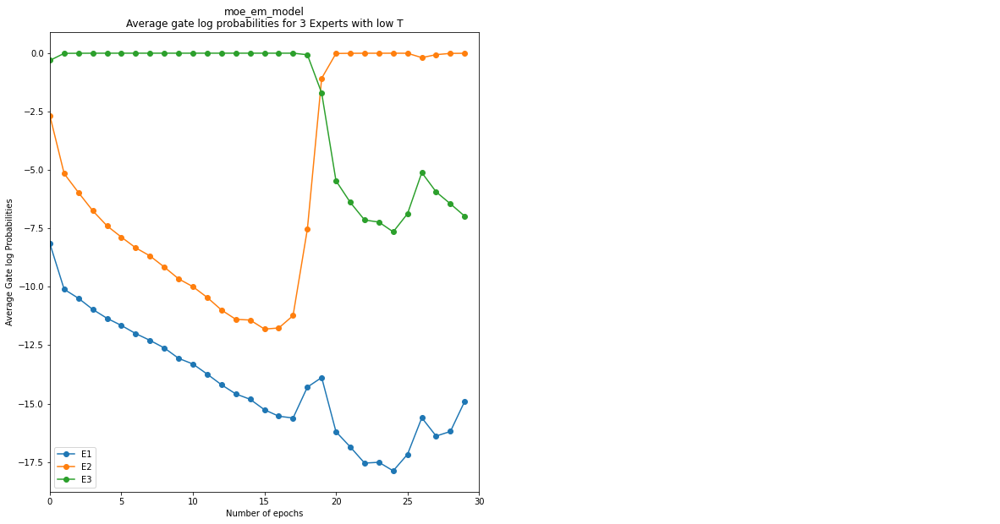

<Figure size 576x288 with 0 Axes>

<Figure size 576x288 with 0 Axes>

<Figure size 576x288 with 0 Axes>

In [22]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(total_experts, total_experts+1):
 
        plot_file = generate_plot_file(dataset,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))

        fig,ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(20,10))

        for m_key, m_val in models.items():

            history = m_val['experts'][i]['history']
            legend_labels = ['E'+str(i) for i in range(1, total_experts+1)]

            ax[0].plot(range(len(history['mean_gate_log_probability'])), history['mean_gate_log_probability'], marker='o')            
            ax[0].set_title(m_key+'\n'+'Average gate log probabilities for ' + str(i) + ' Experts with low T')
            ax[0].legend(legend_labels)
            ax[0].set_xlabel('Number of epochs')
            ax[0].set_xlim(0, num_epochs)
            #plt.ylim(0, 1)
            ax[0].set_ylabel('Average Gate log Probabilities')

            if T>1:
                ax[0,1].plot(range(len(history['mean_gate_log_probability_T'])), history['mean_gate_log_probability_T'], marker='o')
                ax[0,1].set_title(m_key+'\n'+'Average gate log probabilities for ' + str(i) + ' Experts with high T = '+str(T))
                ax[0,1].legend(legend_labels)
                ax[0,1].set_xlabel('Number of epochs')
                ax[0,1].set_xlim(0, num_epochs)
                #plt.ylim(0, 1)
                ax[0,1].set_ylabel('Average Gate log Probabilities')
            else:
                ax[1].axis('off')

            image_file = generate_plot_file(dataset+'_'+m_key,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'gate_log_prob_'+image_file))
            plt.show()


In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(total_experts, total_experts+1):
        plot_file = generate_plot_file(dataset,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))

        fig,ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(20,10))
        ax = ax.flatten()

        for m_key, m_val in models.items():

            history = m_val['experts'][i]['history']
            legend_labels = ['E'+str(i) for i in range(1, total_experts+1)]

            ax[0].plot(range(len(history['var_gate_probability'])), history['var_gate_probability'], marker='o')            
            ax[0].set_title(m_key+'\n'+'Variance gate probabilities for ' + str(i) + ' Experts with low T')
            ax[0].legend(legend_labels)
            ax[0].set_xlabel('Number of epochs')
            ax[0].set_xlim(0, num_epochs)
            #plt.ylim(0, 1)
            ax[0].set_ylabel('Variance Gate Probabilities')

            if T> 1:
                ax[1].plot(range(len(history['var_gate_probability_T'])), history['var_gate_probability_T'], marker='o')
                ax[1].set_title(m_key+'\n'+'Variance gate probabilities for ' + str(i) + ' Experts with high T = '+str(T))
                ax[1].legend(legend_labels)
                ax[1].set_xlabel('Number of epochs')
                ax[1].set_xlim(0, num_epochs)
                #plt.ylim(0, 1)
                ax[1].set_ylabel('Variance Gate Probabilities')
            else:
                ax[1].axis('off')

            image_file = generate_plot_file(dataset+'_'+m_key,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'var_gate_prob_'+image_file))
            plt.show()


model:  multi_class_linear_expert_linear_gate_T_1_5_3_model.pt


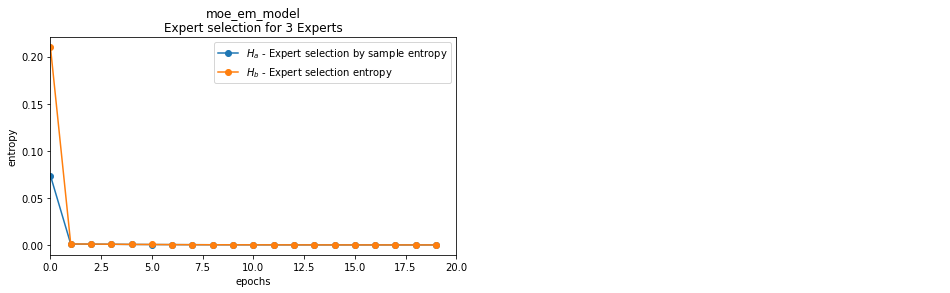

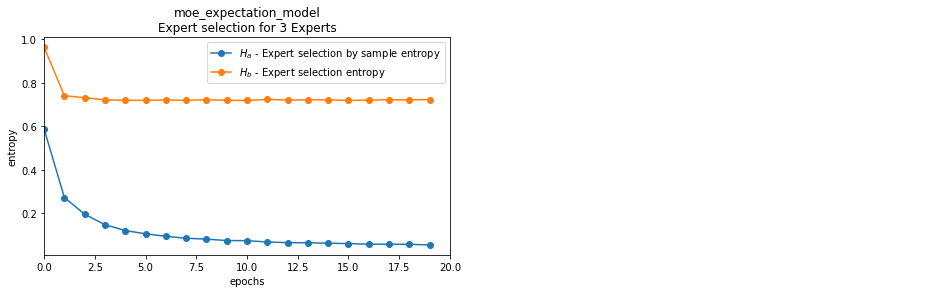

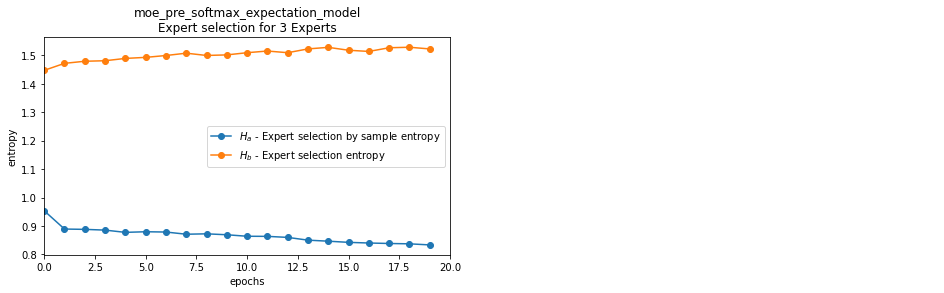

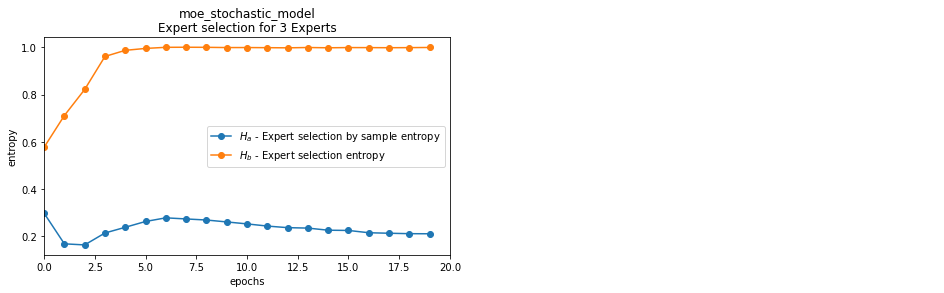

In [37]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(total_experts, total_experts+1):
        plot_file = generate_plot_file(dataset,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))
        legend_labels = [r'$H_a$ - Expert selection by sample entropy', r'$H_b$ - Expert selection entropy']
        for m_key, m_val in models.items():
            fig,ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(16,4))
            ax = ax.flatten()


            history = m_val['experts'][i]['history']

            ax[0].plot(range(num_epochs), history['sample_entropy'], marker='o') 
            ax[0].plot(range(num_epochs), history['entropy'], marker='o') 
            ax[0].set_title(m_key+'\n'+'Expert selection for ' + str(i) + ' Experts')
            ax[0].set_xlabel('epochs')
            ax[0].set_xlim(0, num_epochs)
            ax[0].set_ylabel('entropy')
            ax[0].legend(legend_labels)

            if T> 1:
                ax[1].plot(range(num_epochs), history['entropy_T'], marker='o')
                ax[1].set_title(m_key+'\n'+'Batch entropy for ' + str(i) + ' Experts with high T = '+str(T))
                ax[1].set_xlabel('epochs')
                ax[1].set_xlim(0, num_epochs)
                ax[1].set_ylabel('entropy')
            else:
                ax[1].axis('off')

            image_file = generate_plot_file(dataset+'_'+m_key,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'batch_entropy_'+image_file))
            plt.show()


In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(1, total_experts+1):
 
        plot_file = generate_plot_file(dataset,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))

        fig,ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(20,10))
        ax = ax.flatten()

        for m_key, m_val in models.items():

            history = m_val['experts'][i]['history']
            legend_labels = ['E'+str(j) for j in range(1, i+1)]

            ax[0].plot(range(len(history['gate_var_by_sample'])), history['gate_var_by_sample'], marker='o')            
            ax[0].set_title(m_key+'\n'+'Variance gate probabilities for ' + str(i) + ' Experts with low T')
            ax[0].legend(legend_labels)
            ax[0].set_xlabel('Number of epochs')
            ax[0].set_ylabel('Variance Gate Probabilities')

            if T > 1:
                ax[1].plot(range(len(history['gate_var_by_sample_T'])), history['gate_var_by_sample_T'], marker='o')
                ax[1].set_title(m_key+'\n'+'Variance gate probabilities for ' + str(i) + ' Experts with high T = '+str(T))
                ax[1].legend(legend_labels)
                ax[1].set_xlabel('Number of epochs')
                ax[1].set_ylabel('Variance Gate Probabilities')
            else:
                ax[1].axis('off')

            image_file = generate_plot_file(dataset+'_'+m_key,'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'var_gate_prob_by_sample_'+image_file))
            plt.show()


In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
    print('model: ', plot_file)
    models = torch.load(os.path.join(model_path, plot_file))


    for m_key, m_val in models.items():
        for i in range(total_experts, total_experts+1):
            
            for e in range(i):
                fig,ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(10,10))

                legend_labels = ['C'+str(j) for j in range(0, num_classes)]

                history = m_val['experts'][i]['history']
                ax.plot(range(num_epochs), np.asarray(history['per_exp_class_samples'])[:,e,:], marker='o')
                ax.set_title(m_key+'\n'+'Samples per expert per class for  expert ' + str(e+1))
                ax.legend(legend_labels)
                ax.set_xlabel('Number of epochs')
                ax.set_xlim(0, num_epochs)
                ax.set_ylabel('Samples')

        image_file = generate_plot_file(dataset+'_'+m_key, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
        plt.savefig(os.path.join(fig_path, 'per_class_samples_'+image_file))

        plt.show()
    

In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(1, total_experts+1):

        plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        print('model: ', plot_file)
        models = torch.load(os.path.join(model_path, plot_file))

        fig,ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(20,10))
        ax = ax.flatten()

        for m_key, m_val in models.items():

            legend_labels = ['E'+str(j) for j in range(1, i+1)]

            history = m_val['experts'][i]['history']
            ax[0].plot(range(len(history['exp_samples'])), history['exp_samples'], marker='o')
            ax[0].set_title(m_key+'\n'+'Samples per expert  for ' + str(i) + ' Experts')
            ax[0].legend(legend_labels)
            ax[0].set_xlabel('Number of epochs')
            ax[0].set_xlim(0, num_epochs)
            ax[0].set_ylabel('Samples')

            if T > 1:
                ax[1].plot(range(len(history['exp_samples_T'])), history['exp_samples_T'], marker='o')
                ax[1].set_title(m_key+'\n'+'Samples per expert  for ' + str(i) + ' Experts and T = '+str(T))
                ax[1].legend(legend_labels)
                ax[1].set_xlabel('Number of epochs')
                ax[1].set_xlim(0, num_epochs)
                ax[1].set_ylabel('Samples')
            else:
                ax[1].axis('off')
            image_file = generate_plot_file(dataset+'_'+m_key, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'samples_'+image_file))

            plt.show()


In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(1, total_experts+1):

        plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
        models = torch.load(os.path.join(model_path, plot_file))
        print('model: ', plot_file)
        for m_key, m_val in models.items():
            history = m_val['experts'][i]['history']
            plt.plot(range(len(history['exp_samples_val'])), history['exp_samples_val'], marker='o')

            legend_labels = ['E'+str(j) for j in range(1, i+1)]
            plt.title(m_key+'\n'+'Val samples per expert  for ' + str(i) + ' Experts')
            plt.legend(legend_labels)
            plt.xlabel('Number of epochs')
            plt.xlim(0, num_epochs)
            plt.ylabel('Samples')

            image_file = generate_plot_file(dataset+'_'+m_key, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'val_samples_'+image_file))

            plt.show()


In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(total_experts, total_experts+1):

        plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        models = torch.load(os.path.join(model_path, plot_file))
        for m_key, m_val in models.items():
            fig,ax = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(30,10))
            ax = ax.flatten()

            legend_labels = ['E'+str(j) for j in range(1, i+1)]

            history = m_val['experts'][i]['history']
            ax[0].plot(range(num_epochs), 1-np.asarray(history['expert_accuracy']), marker='o')

            ax[0].set_title(m_key+'\n'+'Overall Training error for ' + str(i) + ' Experts')
            ax[0].legend(legend_labels)
            ax[0].set_xlabel('Number of epochs')
            ax[0].set_xlim(0, num_epochs)
            ax[0].set_ylabel('Error')

            ax[1].plot(range(num_epochs), 1-np.asarray(history['expert_sample_accuracy']), marker='o')

            ax[1].set_title(m_key+'\n'+'Sample based Training error for ' + str(i) + ' Experts')
            ax[1].legend(legend_labels)
            ax[1].set_xlabel('Number of epochs')
            ax[1].set_xlim(0, num_epochs)
            ax[1].set_ylabel('Error')


            if T > 1:
                ax[2].plot(range(num_epochs), 1-np.asarray(history['expert_sample_accuracy_T']), marker='o')
                ax[2].set_title(m_key+'\n'+'Sample based training error for ' + str(i) + ' Experts and High T = '+str(T))
                ax[2].legend(legend_labels)
                ax[2].set_xlabel('Number of epochs')
                ax[2].set_xlim(0, num_epochs)
                ax[2].set_ylabel('Error')
            else:
                ax[2].axis('off')

            image_file = generate_plot_file(dataset+'_'+m_key, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'expert_training_accuracy_'+image_file))

            plt.show()


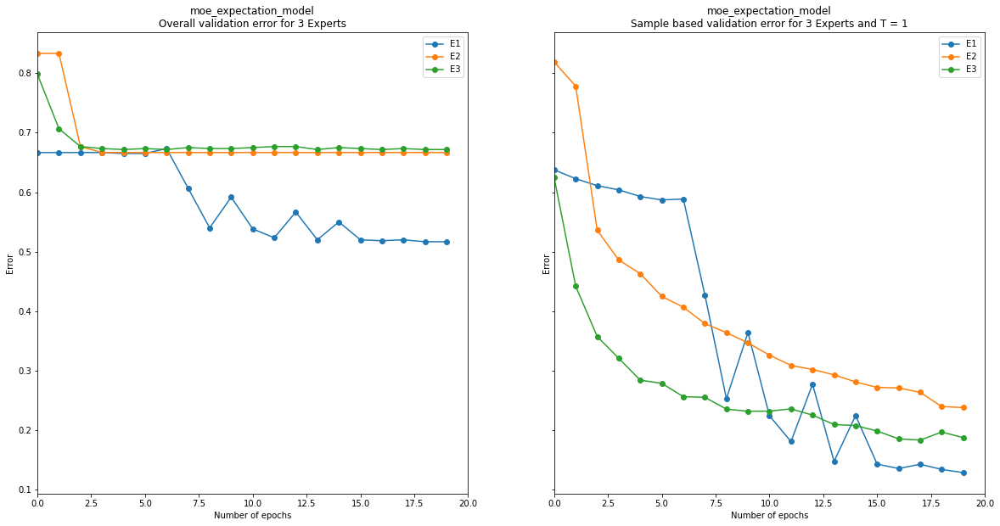

In [23]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
            
    for i in range(total_experts, total_experts+1):

        plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        models = torch.load(os.path.join(model_path, plot_file))
        for m_key, m_val in models.items():
            fig,ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(20,10))
            ax = ax.flatten()

            legend_labels = ['E'+str(j) for j in range(1, i+1)]

            history = m_val['experts'][i]['history']
            ax[0].plot(range(len(history['expert_val_accuracy'])), 1-np.asarray(history['expert_val_accuracy']), marker='o')

            ax[0].set_title(m_key+'\n'+'Overall validation error for ' + str(i) + ' Experts')
            ax[0].legend(legend_labels)
            ax[0].set_xlabel('Number of epochs')
            ax[0].set_xlim(0, num_epochs)
            ax[0].set_ylabel('Error')

            ax[1].plot(range(len(history['expert_sample_val_accuracy'])), 1-np.asarray(history['expert_sample_val_accuracy']), marker='o')
            ax[1].set_title(m_key+'\n'+'Sample based validation error for ' + str(i) + ' Experts and T = '+str(T))
            ax[1].legend(legend_labels)
            ax[1].set_xlabel('Number of epochs')
            ax[1].set_xlim(0, num_epochs)
            ax[1].set_ylabel('Error')

            image_file = generate_plot_file(dataset+'_'+m_key, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'expert_val_accuracy_'+image_file))

            plt.show()


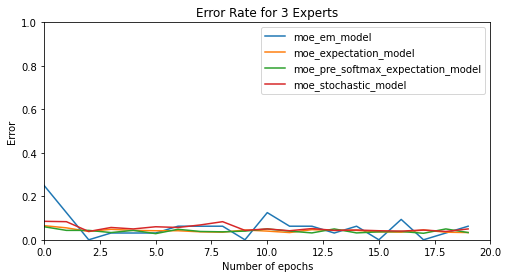

In [31]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
            
    for i in range(total_experts, total_experts+1):
        
        plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        models = torch.load(os.path.join(model_path, plot_file))
        fig,ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(8,4))
        legend_labels = []

        for m_key, m_val in models.items():
            
            legend_labels.append(m_key)
            history = m_val['experts'][i]['history']
            ax.plot(range(len(history['val_accuracy'])), 1-np.asarray(history['val_accuracy']))

            ax.set_title('Error Rate for ' + str(i) + ' Experts')
            ax.legend(legend_labels)
            ax.set_xlabel('Number of epochs')
            ax.set_xlim(0, num_epochs)
            ax.set_ylim(0, 1.0)
            ax.set_ylabel('Error')

        image_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
        plt.savefig(os.path.join(fig_path, 'error_rate_'+image_file))

        plt.show()


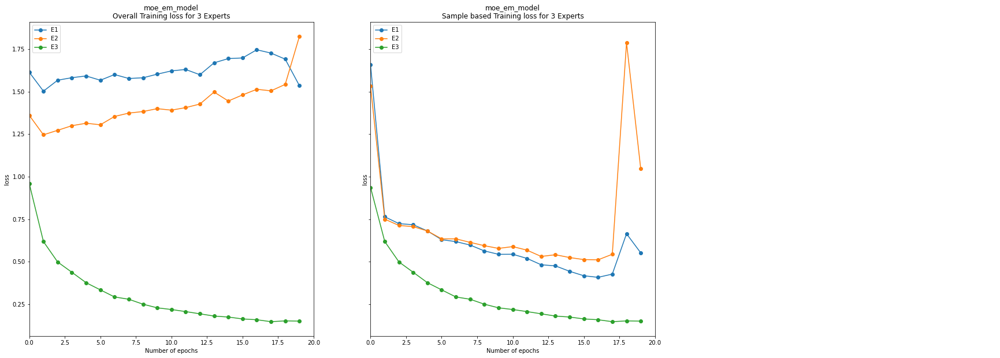

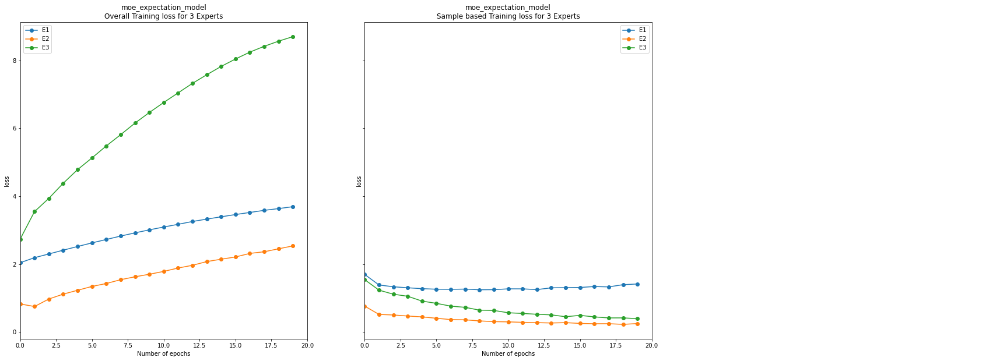

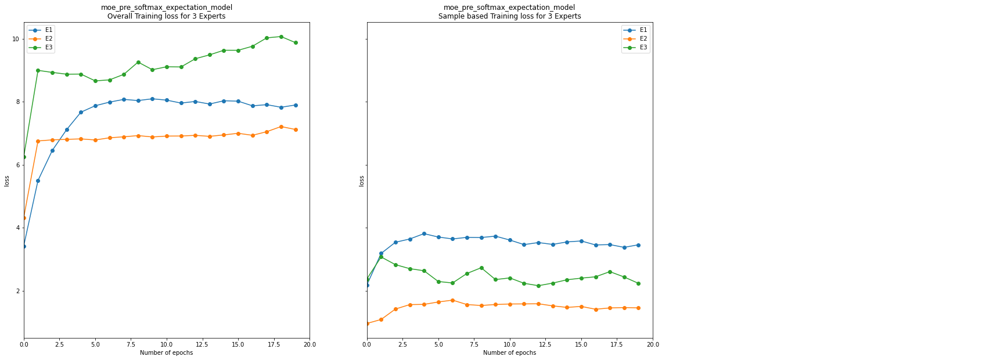

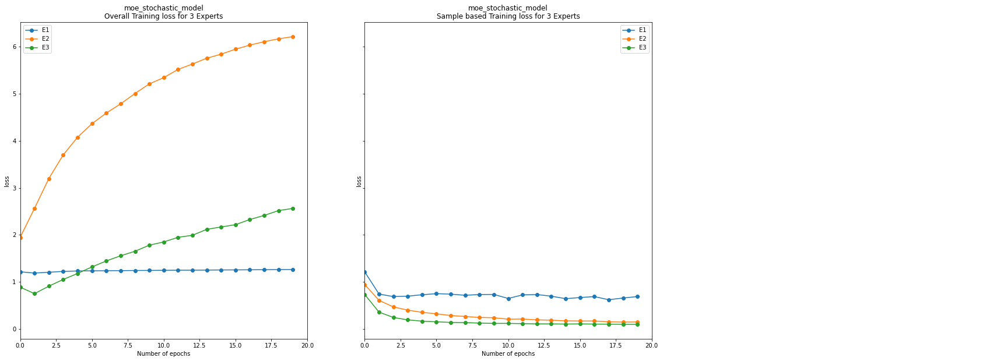

In [65]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(total_experts, total_experts+1):

        plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_model.pt')
        models = torch.load(os.path.join(model_path, plot_file))
        for m_key, m_val in models.items():
            fig,ax = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(30,10))
            ax = ax.flatten()

            legend_labels = ['E'+str(j) for j in range(1, i+1)]

            history = m_val['experts'][i]['history']
            
            ax[0].plot(range(num_epochs), history['expert_loss'], marker='o')

            ax[0].set_title(m_key+'\n'+'Overall Training loss for ' + str(i) + ' Experts')
            ax[0].legend(legend_labels)
            ax[0].set_xlabel('Number of epochs')
            ax[0].set_xlim(0, num_epochs)
            ax[0].set_ylabel('loss')

            ax[1].plot(range(num_epochs), history['expert_sample_loss'], marker='o')

            ax[1].set_title(m_key+'\n'+'Sample based Training loss for ' + str(i) + ' Experts')
            ax[1].legend(legend_labels)
            ax[1].set_xlabel('Number of epochs')
            ax[1].set_xlim(0, num_epochs)
            ax[1].set_ylabel('loss')

            if T > 1:
                ax[2].plot(range(num_epochs), history['expert_sample_loss_T'], marker='o')

                ax[2].set_title(m_key+'\n'+'Sample based training error for ' + str(i) + ' Experts and High T = '+str(T))
                ax[2].legend(legend_labels)
                ax[2].set_xlabel('Number of epochs')
                ax[2].set_xlim(0, num_epochs)
                ax[2].set_ylabel('loss')
            else:
                ax[2].axis('off')

            image_file = generate_plot_file(dataset+'_'+m_key, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'expert_training_loss_'+image_file))

            plt.show()


In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
        plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
        models = torch.load(os.path.join(model_path, plot_file))
        for m_key, m_val in models.items():
            for i in range(1, total_experts+1):
                fig,ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(20,10))
                ax = ax.flatten()

                history = m_val['experts'][i]['history']
                ax[0].plot(range(num_epochs), history['kl_div_gate'], marker='o')

                ax[0].set_title(m_key+'\n'+'Gate probabilities KL divergence for ' + str(i) + ' Experts')
                ax[0].set_xlabel('Number of epochs')
                ax[0].set_xlim(0, num_epochs)
                ax[0].set_ylabel('KL divergence')

                if T>1:
                    ax[1].plot(range(num_epochs), history['kl_div_gate_T'], marker='o')
                    ax[1].set_title(m_key+'\n'+'Gate probabilities KL divergence for ' + str(i) + ' Experts and High T = '+str(T))
                    ax[1].set_xlabel('Number of epochs')
                    ax[1].set_xlim(0, num_epochs)
                    ax[1].set_ylabel('KL divergence')
                else:
                    ax[1].axis('off')

                image_file = generate_plot_file(dataset+'_'+m_key, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
                plt.savefig(os.path.join(fig_path, 'gate_kl_divergence_'+image_file))

                plt.show()


model:  multi_class_linear_expert_linear_gate_em_T_1_5_3_model.pt


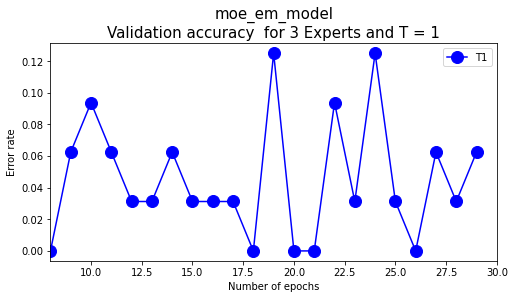

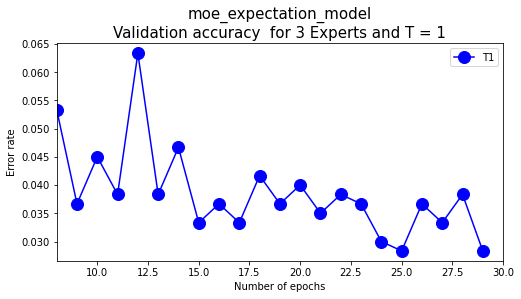

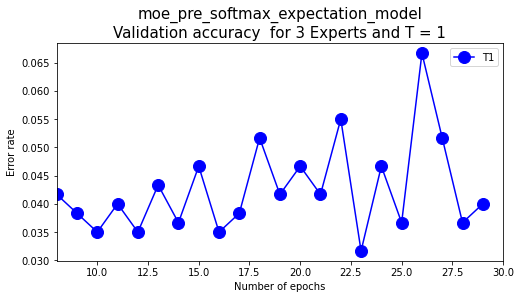

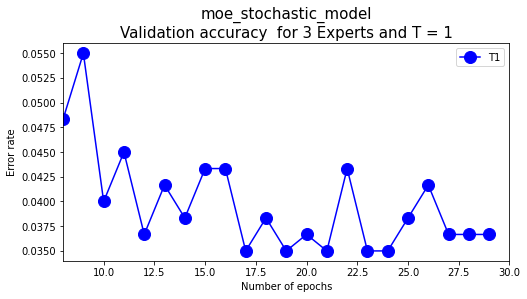

In [32]:
plt.rcParams["figure.figsize"] = (8,4)
colors = ['b','g','r','c', 'm', 'k','tab:blue','tab:orange','tab:green','tab:red','tab:purple','tab:brown',
          'tab:pink','tab:gray','tab:olive','tab:cyan']
start = 8
temps=range(1,T_max+1)
for T in temps:
    plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
    print('model: ', plot_file)
    models = torch.load(os.path.join(model_path, plot_file))

    for m_key, m_val in models.items():
        val_accuracies = []
        #for T in range(1, T_max+1):
        legend_labels = []

        for i in range(total_experts, total_experts+1):
            history = m_val['experts'][i]['history']
            val_accuracies.append((1-np.asarray(history['val_accuracy']))[start:])

        legend_labels.append('T'+str(T))
        val_accuracies = np.asarray(val_accuracies)

        for i in range(len(val_accuracies)):
            if i > 5:
                marker = '*'
                markersize = 20
            else:
                marker = 'o'
                markersize = 12
            plt.plot(range(start, num_epochs), val_accuracies[i], color=colors[i], marker=marker, markersize=markersize)

            plt.title(m_key+'\n'+'Validation accuracy  for ' + str(total_experts) + ' Experts and T = '+str(T), fontsize=15)
            plt.legend(legend_labels, prop={'size': 10})
            plt.xlabel('Number of epochs', fontsize=10)
            plt.xlim(start, num_epochs)
            plt.ylabel('Error rate',  fontsize=10)
            plt.tick_params(labelsize=10)
            plt.ion()
            plt.isinteractive
            image_file = generate_plot_file(dataset+'_'+m_key, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'val_accuracy_'+image_file))
            plt.show()
    

In [ ]:
plt.rcParams["figure.figsize"] = (8,4)
for T in range(1, T_max+1):
    for i in range(total_experts, total_experts+1):

        plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
        models = torch.load(os.path.join(model_path, plot_file))

        for m_key, m_val in models.items():
            print('Mutual information for ', m_key)
            history = m_val['experts'][i]['history']

            plt.plot(range(len(history['mutual_EY'])), history['mutual_EY'], marker='o')

            legend_labels = ['MI_EY']
            plt.title('Mutual information of gate and classes: ' + str(i) + ' Experts')
            plt.legend(legend_labels)
            plt.xlabel('Number of epochs')
            plt.xlim(0, num_epochs)
            plt.ylabel('Mutual Information')
            image_file = generate_plot_file(dataset+'_'+m_key, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
            plt.savefig(os.path.join(fig_path, 'mutual_info_'+image_file))

            plt.show()
        

In [ ]:
for m_key, m_val in models.items():
    print('Mutual information for ', m_key)
    for i in range(1, total_experts+1):
        legend_labels = []
        history = m_val['experts'][i]['history']
        print('EY', history['EY'][-1], '\n\n')
        
        plt.plot(range(len(history['mutual_EY'])), history['mutual_EY'])
        plt.plot(range(len(history['H_EY'])), history['H_EY'],marker='X')
        plt.plot(range(len(history['H_Y'])), 
                 [history['H_E'][i] + history['H_Y'][i] for i in range(len(history['H_Y']))], marker='o')
        
        legend_labels = ['MI_EY']
        legend_labels += ['H_EY']
        legend_labels += ['H_E+H_Y']
                 
        plt.title('Mutual information of gate and classes: ' + str(i) + ' Experts')
        plt.legend(legend_labels)
        plt.xlabel('Number of epochs')
        plt.xlim(0, num_epochs)
        plt.ylabel('Mutual Information')
        #plt.ylim(0, 1)
        plt.savefig('figures/all/mutual_information_'+dataset+'_attention_loss_importance_0_'+str(num_classes)+'_'+str(i)+'_experts.png')
        plt.show()
        

In [ ]:
layer_1_neurons = {}
layer_2_neurons = {}
for m_key, m_val in models.items():
        
        gate_model = m_val['experts'][1]['model'].gate
        
        parameters = gate_model.parameters()
        
        
        for i, parameter in enumerate(parameters, 0):
            if i == 0:
                layer_1_neurons['wts']= parameter.detach().numpy()
            if i == 1:
                layer_1_neurons['bias'] = parameter.detach().numpy()
            if i == 2:
                layer_2_neurons['wts']= parameter.detach().numpy()
            if i == 3:
                layer_2_neurons['bias'] = parameter.detach().numpy()
        #print(layer_1_neurons)
        
        break
labels = [] 
fig,ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(20,10))
outputs = []
x2 = np.linspace(-1, 1, 100)

for i in range(0,4):
    x1 = ((-1* layer_1_neurons['wts'][i][1]*x2)-layer_1_neurons['bias'][i])/layer_1_neurons['wts'][i][0]
    labels.append('neuron '+str(i+1))    
    sns.lineplot(x=x1, y=x2,ax=ax)
    #print(layer_1_neurons['wts'].shape)
    #print(np.asarray([x1, x2]).shape)
   
    print(np.dot(layer_1_neurons['wts'], np.asarray([x1, x2]))[:,0])
    print(np.repeat(np.reshape(layer_1_neurons['bias'],(4,1)),100,axis=1)[:,0])
    z = np.transpose(np.dot(layer_1_neurons['wts'], np.asarray([x1, x2]))+np.repeat(np.reshape(layer_1_neurons['bias'],(4,1)),100,axis=1))
    z = np.where(z<0,0,z)
    print(z[0,:])
plt.legend(labels)


In [ ]:
from sympy import Symbol
from sympy.solvers import nsolve, solve
from sympy import sin, tan


x1 = Symbol('x1')
x2 = Symbol('x2')

#z = layer_1_neurons['wts'][0]*[[x1],[x2]]+layer_1_neurons['bias'][0]
#print(solve(np.dot(layer_2_neurons['wts'][0],
#               [[max(0, np.dot(layer_1_neurons['wts'][0],[[x1],[x2]])+layer_1_neurons['bias'][0])],
#               [max(0, np.dot(layer_1_neurons['wts'][1],[[x1],[x2]])+layer_1_neurons['bias'][1])],
#               [max(0, np.dot(layer_1_neurons['wts'][2],[[x1],[x2]])+layer_1_neurons['bias'][2])],
#               [max(0, np.dot(layer_1_neurons['wts'][3],[[x1],[x2]])+layer_1_neurons['bias'][3])]
#               ])+layer_2_neurons['bias'][0]
#              , x1))



### Visualise decision boundaries of mixture of expert model, expert model and gate model

In [40]:
#create meshgrid
def generate_meshgrid(X):
    resolution = 100 # 100x100 background pixels
    a2d_min, a2d_max = np.min(X[:,0]), np.max(X[:,0])
    b2d_min, b2d_max = np.min(X[:,1]), np.max(X[:,1])
    a, b = np.meshgrid(np.linspace(a2d_min, a2d_max, resolution), 
                       np.linspace(b2d_min, b2d_max, resolution))
    generated_data = torch.tensor(np.c_[a.ravel(), b.ravel()], dtype=torch.float32)
    return generated_data

In [41]:
def labels(p, palette=palette):
    pred_labels = torch.argmax(p, dim=1)
    uniq_y = np.unique(pred_labels)
    pred_color = [palette[i] for i in uniq_y]
    return pred_color, pred_labels

In [42]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def predict(dataloader, model):
        
        pred_labels = []
        true_labels = []
        for i, data in enumerate(dataloader):
            inputs, labels = data
            true_labels.append(labels)
            pred_labels.append(torch.argmax(model(inputs), dim=1))
            
        return torch.stack(true_labels), torch.stack(pred_labels)

In [43]:
def visualize(models, total_experts, num_classes, generated_data, X_orig_data, y_orig_data, filename):
    print(total_experts)
    keys = models.keys()
    print(keys)
    N = len(keys)
    fontsize = 30-((N-1)*5)
    fontsize1 = 25-((N-1)*3)
    labelsize = 25-((N-1)*3)
    for e in range(total_experts, total_experts+1):
        nrows = e+4
        ncols = N
        thefigsize = (ncols*(15-(ncols*2)),nrows*(15-(ncols*2)))
        print('Number of Experts:', e)

        fig,ax = plt.subplots(nrows, ncols, sharex=True, sharey=True, figsize=thefigsize)
        ax = ax.flatten()

        thefigsize1 = (ncols*(12-(ncols*2)),1*(12-(ncols*2)))
#         fig1,ax1 = plt.subplots(1, ncols, sharex=True, sharey=True, figsize=thefigsize1)
#         if ncols > 1:
#             ax1.flatten()
#         else:
#             ax1 = [ax1]

        index = 0
        for m_key, m_val in models.items():
            print('\n',m_key)
            moe_model = m_val['experts'][e]['model']
            
            pred_orig_data = moe_model(X_orig_data)
            
            orig_data_expert_outputs = moe_model.expert_outputs
            orig_data_gate_outputs = moe_model.gate_outputs
            
            pred_orig_data_color,pred_orig_data_labels = labels(pred_orig_data)
        
            pred_gen_data = moe_model(generated_data)
            pred_gen_data_expert_output = moe_model.expert_outputs
            
            pred_gen_data_color,pred_gen_data_labels = labels(pred_gen_data)
              
            sns.scatterplot(x=generated_data[:,0],y=generated_data[:,1],
                            hue=pred_gen_data_labels,palette=pred_gen_data_color, legend=False,s=10, ax=ax[index])
            sns.scatterplot(x=X_orig_data[:,0], y=X_orig_data[:,1], hue=np.asarray(y_orig_data), palette=palette[0:num_classes], marker='X', s=40,ax=ax[index])
            indices = np.where((pred_orig_data_labels == y_orig_data )== False)[0]
            sns.scatterplot(x=X_orig_data[indices,0],y=X_orig_data[indices,1],
                            hue=['mc']*len(indices), palette=['r'], marker='X', ax=ax[index])
#             plt.setp(ax[index].get_legend().get_texts(), fontsize=labelsize) 
            ax[index].set_title(m_key+'\n'+'Mixture of Experts', fontsize=fontsize)
            ax[index].set_ylabel('Dim 2', fontsize=fontsize1)
            ax[index].set_xlabel('Dim 1', fontsize=fontsize1)
            ax[index].tick_params(labelsize=labelsize)

            for i in range(0, e):
                pred_gen_data_expert_color,pred_gen_data_expert_labels = labels(pred_gen_data_expert_output[:,i,:])
                sns.scatterplot(x=generated_data[:,0],y=generated_data[:,1],
                                hue=pred_gen_data_expert_labels,palette=pred_gen_data_expert_color, legend=False, s=10, ax=ax[((i+1)*N)+index])
                
                sns.scatterplot(x=X_orig_data[:,0], y=X_orig_data[:,1], hue=np.asarray(y_orig_data), palette=palette[0:num_classes], marker='X', s=40, ax=ax[((i+1)*N)+index])
                
                pred_orig_data_expert_color,pred_orig_data_expert_labels = labels(orig_data_expert_outputs[:,i,:])
                indices = np.where((pred_orig_data_expert_labels == y_orig_data) == False)[0]
                sns.scatterplot(x=X_orig_data[indices,0],y=X_orig_data[indices,1],
                                hue=['mc']*len(indices), palette=['r'], marker='X', ax=ax[((i+1)*N)+index])

#                 plt.setp(ax[((i+1)*N)+index].get_legend().get_texts(), fontsize=labelsize) 
                ax[((i+1)*N)+index].set_title('Expert '+str(i+1)+' Model', fontsize=fontsize)
                ax[((i+1)*N)+index].set_ylabel('Dim 2', fontsize=fontsize1)
                ax[((i+1)*N)+index].set_xlabel('Dim 1', fontsize=fontsize1)
                ax[((i+1)*N)+index].tick_params(labelsize=labelsize)

            palette_gate = sns.color_palette("Paired")+sns.color_palette('Set2')
            #pred_gate = moe_model.gate(generated_data)
            pred_gate_gen_data_output = moe_model.gate_outputs
            pred_gate_gen_data_color, pred_gate_gen_data_labels = labels(pred_gate_gen_data_output, palette_gate)

            sns.scatterplot(x=generated_data[:,0],y=generated_data[:,1],
                            hue=pred_gate_gen_data_labels+1,palette=pred_gate_gen_data_color, legend=False, ax=ax[((e+1)*N)+index])
            sns.scatterplot(x=X_orig_data[:,0], y=X_orig_data[:,1], hue=np.asarray(y_orig_data), palette=palette[0:num_classes], ax=ax[((e+1)*N)+index])
            
            ax[((e+1)*N)+index].set_title('Gate Model Predicting Meshgrid', fontsize=fontsize)
            ax[((e+1)*N)+index].set_ylabel('Dim 2', fontsize=fontsize1)
            ax[((e+1)*N)+index].set_xlabel('Dim 1', fontsize=fontsize1)
            ax[((e+1)*N)+index].tick_params(labelsize=labelsize)
            
            pred_gate_orig_data_color, pred_gate_orig_data_labels = labels(orig_data_gate_outputs, palette_gate)
            sns.scatterplot(x=X_orig_data[:,0],y=X_orig_data[:,1],
                            hue=pred_gate_orig_data_labels+1,palette=pred_gate_orig_data_color, ax=ax[((e+2)*N)+index])   
            
            ax[((e+2)*N)+index].set_title('Gate Model Predicting Orig Data', fontsize=fontsize)
            ax[((e+2)*N)+index].set_ylabel('Dim 2', fontsize=fontsize1)
            ax[((e+2)*N)+index].set_xlabel('Dim 1', fontsize=fontsize1)
            ax[((e+2)*N)+index].tick_params(labelsize=labelsize)
            
            indices = np.where((pred_orig_data_labels == y_orig_data )== False)[0]
            pred_gate_orig_data_color, pred_gate_orig_data_labels = labels(orig_data_gate_outputs[indices], palette_gate)
            sns.scatterplot(x=X_orig_data[indices,0],y=X_orig_data[indices,1],
                            hue=pred_gate_orig_data_labels+1,palette=pred_gate_orig_data_color, ax=ax[((e+3)*N)+index])   
            
            ax[((e+3)*N)+index].set_title('Gate Model Misclassifying Orig Data', fontsize=fontsize)
            ax[((e+3)*N)+index].set_ylabel('Dim 2', fontsize=fontsize1)
            ax[((e+3)*N)+index].set_xlabel('Dim 1', fontsize=fontsize1)
            ax[((e+3)*N)+index].tick_params(labelsize=labelsize)        
            

#             history = m_val['experts'][e]['history']
#             gate_prob = np.asarray(history['mean_gate_probability'])
#             for i in range(0, total_experts):
#                 sns.lineplot(x=np.asarray(list(range(0,num_epochs))), y=gate_prob[:,i], marker='o', ax=ax1[index])

#             ax1[index].set_title('Average gate probability for ' + str(total_experts), fontsize=fontsize)
#             ax1[index].legend(['E'+str(i) for i in range(1, e+1)])
#             ax1[index].set_xlabel('Number of epochs', fontsize=fontsize1)
#             ax1[index].set_xlim(0,num_epochs)
#             ax1[index].set_ylabel('Avg gate probabilitis per expert', fontsize=fontsize1)
#             ax1[index].set_ylim(0,1)
#             ax1[index].tick_params(labelsize=labelsize)
            
#             if T > 1.0:
#                 fig2,ax2 = plt.subplots(1, ncols, sharex=True, sharey=True, figsize=thefigsize1)

#                 history = m_val['experts'][e]['history']
#                 exp_sample_accuracy = np.asarray(history['expert_sample_accuracy'])
#                 for i in range(0, total_experts):
#                     sns.lineplot(x=np.asarray(list(range(0,num_epochs))), y=exp_sample_accuracy[:,i], marker='o', ax=ax2)

#                 ax2.set_title('Accuracy per expert  for '+ str(total_experts)+' experts and T = '+str(T), fontsize=fontsize)
#                 ax2.legend(['E'+str(i) for i in range(1, e+1)])
#                 ax2.set_xlabel('Number of epochs', fontsize=fontsize1)
#                 ax2.set_xlim(0,num_epochs)
#                 ax2.set_ylabel('Accuracy', fontsize=fontsize1)
#                 ax2.tick_params(labelsize=labelsize)
                
#                 fig2.savefig(filename +m_key+'_expert_sample_accuracy_T_'+str(T)+'_'+str(e)+'_experts.png')
            
            index += 1
        fig.savefig(filename +'_'+str(e)+'_experts.png')
#         fig1.savefig(filename +'_'+m_key+'_gate_prob_T_'+str(T)+'_'+str(e)+'_experts.png')
        plt.show()
    


multi_class_linear_expert_linear_gate_T_1_5_5_model.pt
5
dict_keys(['moe_em_model', 'moe_expectation_model', 'moe_pre_softmax_expectation_model', 'moe_stochastic_model'])
Number of Experts: 5

 moe_em_model

 moe_expectation_model

 moe_pre_softmax_expectation_model

 moe_stochastic_model


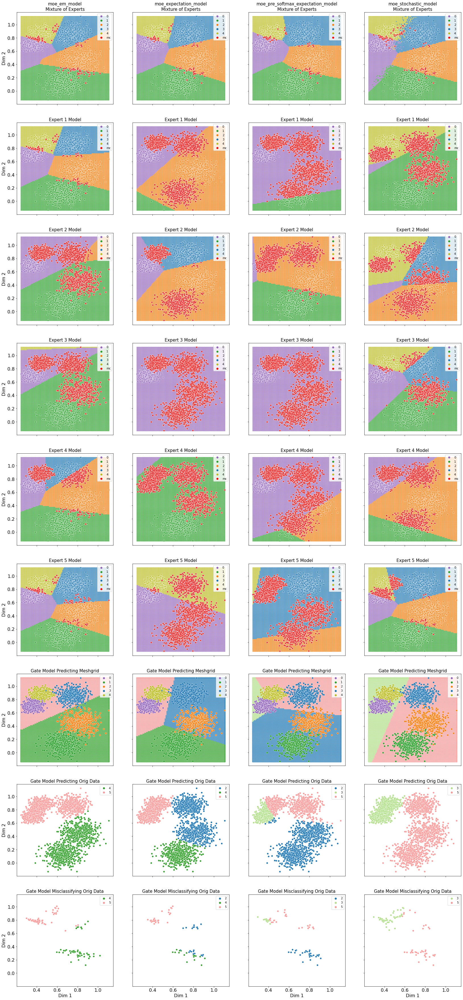

In [44]:
generated_data = generate_meshgrid(X)
T = 1
plot_file = generate_plot_file(dataset, 'T_'+str(T)+'_'+str(num_classes)+'_'+str(total_experts)+'_model.pt')
print(plot_file)
models = torch.load(os.path.join(model_path, plot_file))
image_file = generate_plot_file(dataset, str(num_classes))
filename = os.path.join(fig_path, image_file)

visualize(models, total_experts, num_classes, generated_data, trainset[:][0], trainset[:][1], filename)

In [27]:
# for m_key, m_val in models.items():
single_expert_model = nn.Sequential(                   
                        nn.Linear(2,num_classes),
                        nn.Softmax(dim=1)
                    )        

In [126]:
# for m_key, m_val in models.items():
single_expert_escort_model = nn.Sequential(                   
                        nn.Linear(2,num_classes),
                        escort()
                    )        

In [ ]:
# for m_key, m_val in models.items():
single_linear_model_simple = nn.Sequential(                   
                        nn.Linear(2, 10),
                        nn.Linear(10,num_classes),
                        nn.Softmax(dim=1)
                    )        

In [ ]:
# for m_key, m_val in models.items():
single_non_linear_model_simple = nn.Sequential(                   
                        nn.Linear(2, 10),
                        nn.ReLU(),
                        nn.Linear(10,num_classes),
                        nn.Softmax(dim=1)
                    )        

In [ ]:
single_model_complex = nn.Sequential(
                    nn.Linear(2, (total_experts+1)*8),
                    nn.ReLU(),
                    nn.Linear((total_experts+1)*8, (total_experts+1)*8),
                    nn.ReLU(),
                    nn.Linear((total_experts+1)*8, (total_experts+1)*4),
                    nn.ReLU(),
                    nn.Linear((total_experts+1)*4,num_classes),
                    nn.Softmax(dim=1)
                )        

In [ ]:
single_model = single_model_complex

In [34]:
single_model = single_expert_model

In [35]:
params = [p.numel() for p in single_model.parameters() if p.requires_grad]
print(params, sum(params))

[10, 5] 15


In [37]:
single_model_optimizer = optim.Adam(single_model.parameters(),
                                      lr=0.001)

In [38]:
single_model_history = {'loss':[], 'accuracy':[], 'val_accuracy':[]}
for epoch in range(0, num_epochs):
    running_loss = 0.0
    training_accuracy = 0.0
    test_accuracy = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, train_labels = data

        # zero the parameter gradients
        single_model_optimizer.zero_grad()

        # forward + backward + optimize
        outputs = single_model(inputs)
        loss = cross_entropy_loss(outputs, train_labels)
        loss.backward()
        single_model_optimizer.step()
        
        running_loss += loss.item()
        training_accuracy += accuracy(outputs, train_labels)
        
    for j, test_data in enumerate(testloader, 0):
        test_input, test_labels = test_data
        test_outputs = single_model(test_input)
        test_accuracy += accuracy(test_outputs, test_labels)
    single_model_history['loss'].append(running_loss/(i+1))
    single_model_history['accuracy'].append(training_accuracy/(i+1))
    single_model_history['val_accuracy'].append(test_accuracy/(j+1))
    print('epoch: %d loss: %.2f training accuracy: %.2f val accuracy: %.2f' %
            (epoch + 1, running_loss / (i+1), training_accuracy/(i+1), test_accuracy/(j+1)))

print('Finished Training')

epoch: 1 loss: 1.83 training accuracy: 0.20 val accuracy: 0.20
epoch: 2 loss: 1.76 training accuracy: 0.20 val accuracy: 0.20
epoch: 3 loss: 1.71 training accuracy: 0.20 val accuracy: 0.20
epoch: 4 loss: 1.67 training accuracy: 0.20 val accuracy: 0.20
epoch: 5 loss: 1.64 training accuracy: 0.20 val accuracy: 0.20
epoch: 6 loss: 1.61 training accuracy: 0.20 val accuracy: 0.20
epoch: 7 loss: 1.59 training accuracy: 0.21 val accuracy: 0.21
epoch: 8 loss: 1.57 training accuracy: 0.23 val accuracy: 0.23
epoch: 9 loss: 1.55 training accuracy: 0.25 val accuracy: 0.26
epoch: 10 loss: 1.53 training accuracy: 0.27 val accuracy: 0.29
epoch: 11 loss: 1.51 training accuracy: 0.31 val accuracy: 0.33
epoch: 12 loss: 1.49 training accuracy: 0.35 val accuracy: 0.35
epoch: 13 loss: 1.48 training accuracy: 0.38 val accuracy: 0.36
epoch: 14 loss: 1.46 training accuracy: 0.37 val accuracy: 0.38
epoch: 15 loss: 1.45 training accuracy: 0.39 val accuracy: 0.41
epoch: 16 loss: 1.43 training accuracy: 0.44 val 

Text(0.5, 0, 'Dim 1')

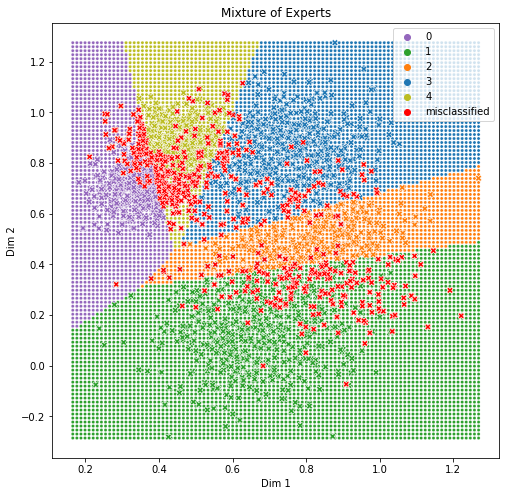

In [45]:
fig,ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(8,8))
generated_data = generate_meshgrid(X)
pred = single_model(generated_data)
pred_color,pred_labels = labels(pred)
sns.scatterplot(x=generated_data[:,0],y=generated_data[:,1],
                hue=pred_labels,palette=pred_color, s=10, legend=False, ax=ax)

X_orig_data = trainset[:][0]
y_orig_data = trainset[:][1]

sns.scatterplot(x=X_orig_data[:,0], y=X_orig_data[:,1], hue=np.asarray(y_orig_data), palette=palette[0:num_classes], marker='X', s=40, ax=ax)

pred_orig_data = single_model(X_orig_data)
pred_orig_data_color,pred_orig_data_labels = labels(pred_orig_data)
indices = np.where((pred_orig_data_labels == y_orig_data) == False)[0]
sns.scatterplot(x=X_orig_data[indices,0],y=X_orig_data[indices,1],
                                hue=['misclassified']*len(indices), palette=['r'], marker='X', ax=ax)

ax.set_title('Mixture of Experts')
ax.set_ylabel('Dim 2')
ax.set_xlabel('Dim 1')

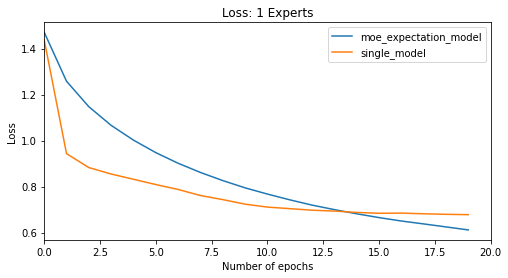

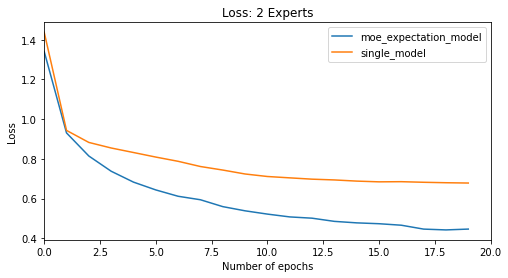

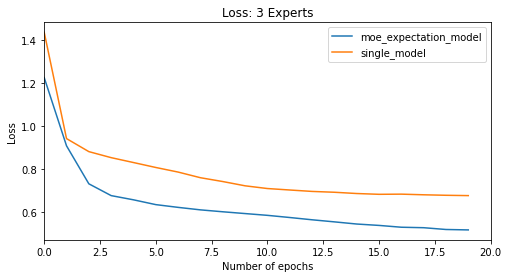

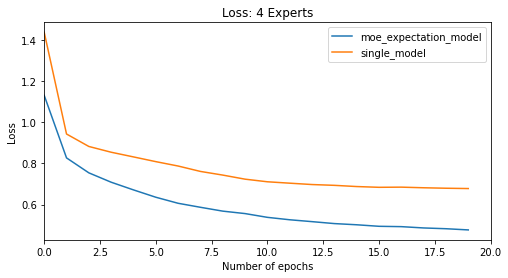

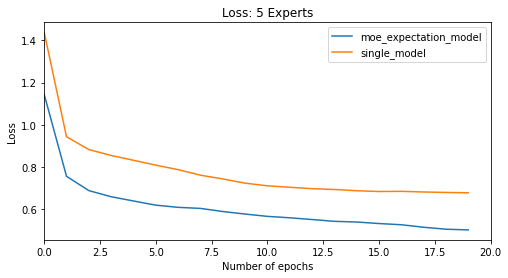

In [133]:
for i in range(1, total_experts+1):
    legend_labels = []
    for m_key, m_val in models.items():
        history = m_val['experts'][i]['history']
        plt.plot(range(len(history['loss'])), history['loss'])
        legend_labels.append(m_key)
    plt.plot(range(len(single_model_history['loss'])), single_model_history['loss'])
    legend_labels.append('single_model')
    plt.title('Loss: ' + str(i) + ' Experts')
    plt.legend(legend_labels)
    plt.xlabel('Number of epochs')
    plt.xlim(0, num_epochs)
    plt.ylabel('Loss')
    plt.savefig(os.path.join(fig_path, dataset+'single_expert_escort_model_'+ str(num_classes)+'_'+str(i)+'_experts.png'))
    plt.show()

In [ ]:
for i in range(1, total_experts+1):
    legend_labels = []
    for m_key, m_val in models.items():
        history = m_val['experts'][i]['history']
        plt.plot(range(len(history['accuracy'])), history['accuracy'])
        legend_labels.append(m_key)
    plt.plot(range(len(single_model_history['accuracy'])), single_model_history['accuracy'])
    legend_labels.append('single_model')
    plt.title('Accuracy: ' + str(i) + ' Experts')
    plt.legend(legend_labels)
    plt.xlabel('Number of epochs')
    plt.xlim(0, num_epochs)
    plt.ylabel('Training Accuracy')
    plt.ylim(0, 1)
    plt.savefig('figures/all/accuracy_'+dataset+'_'+str(num_classes)+'_'+str(i)+'_experts.png')
    plt.show()